---
PYTHON CHO KHOA HỌC DỮ LIỆU - 21KDL1  
**FINAL PROJECTS - MOVIES RECOMMENDER SYSTEM**
---






**Giới thiệu thành viên**

| MSSV     | Họ Tên                | Công Việc                                          | 
|----------|-----------------------|----------------------------------------------------|
| 21280110 | Huỳnh Lê Minh Thư     | Data Preprocessing<br><br> Data Visualization <br><br> 2 Model: Weighted Rating & Content-based | 
| 21280119 | Phạm Ngọc Phương Uyên | 2 Model: Collaborative Filtering & Hybrid           |
| 21280123 | Nguyễn Thị Lan Diệp   | Introduction<br><br> Data Exploration<br><br> Data Preprocessing                |

**About dataset**

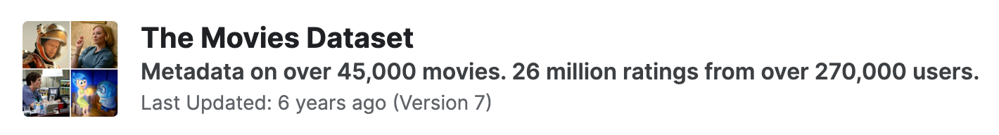

**Bối cảnh**

Những tập tin này chứa thông tin về metadata cho tất cả 45,000 bộ phim được liệt kê trong Bộ dữ liệu Full MovieLens. Bộ dữ liệu này bao gồm các bộ phim được phát hành vào hoặc trước tháng 7 năm 2017. Các điểm dữ liệu bao gồm diễn viên, đoàn làm phim, từ khóa cốt truyện, ngân sách, doanh thu, poster, ngày phát hành, ngôn ngữ, công ty sản xuất, quốc gia, số lượng phiếu bầu TMDB và điểm bình chọn trung bình TMDB.

Bộ dữ liệu này cũng chứa các tập tin chứa 26 triệu đánh giá từ 270,000 người dùng cho tất cả 45,000 bộ phim. Đánh giá được đưa ra trên một thang điểm từ 1-5 và đã được thu thập từ trang web chính thức của GroupLens.

**Nội dung**

Bộ dữ liệu này bao gồm các tập tin sau:

- movies_metadata.csv: Tệp chính chứa thông tin về metadata của 45,000 bộ phim trong Bộ dữ liệu Full MovieLens. Các đặc điểm bao gồm poster, hình nền, ngân sách, doanh thu, ngày phát hành, ngôn ngữ, quốc gia sản xuất và công ty.

- keywords.csv: Chứa các từ khóa cốt truyện cho các bộ phim MovieLens của chúng tôi. Có sẵn dưới dạng một Object JSON được chuỗi hóa.

- credits.csv: Bao gồm thông tin về Diễn viên và Đoàn làm phim cho tất cả các bộ phim của chúng tôi. Có sẵn dưới dạng một Object JSON được chuỗi hóa.

- ratings.csv: Đánh giá của người dùng.

# **Các bước thực hiện đồ án**


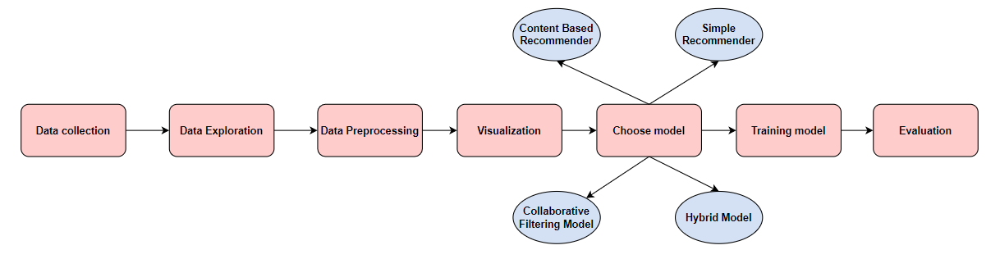

# **Explore Data**

## Import module

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# import missingno as msno
from collections import Counter
import warnings; warnings.simplefilter('ignore')

## Load dataset

The Full Dataset: Consists of 26,000,000 ratings and 750,000 tag applications applied to 45,000 movies by 270,000 users. Includes tag genome data with 12 million relevance scores across 1,100 tags.

In [ ]:
df_movies = pd.read_csv('movies_metadata.csv')
df_credits = pd.read_csv('credits.csv')
df_keywords = pd.read_csv('keywords.csv')
df_ratings = pd.read_csv('ratings.csv')

## Understand dataset

Function

In [ ]:
def info_df(df):
    print('Shape: \n', df.shape)

    # Kiểm tra xem có giá trị trùng lặp trong trường 'id' hoặc 'userID' và 'movieId' không.
    if 'userId' in df.columns and 'movieId' in df.columns:
        # Kiểm tra giá trị trùng lặp của cột 'userID' và 'movieId'
        has_duplicate_ids = df.duplicated(['userId', 'movieId']).any()
        if has_duplicate_ids:
            print("\nCó giá trị trùng lặp trong trường 'userID' và 'movieId'\n")
        else:
            print("\nKhông có giá trị trùng lặp trong trường 'userID' và 'movieId'\n")
    elif 'id' in df.columns:
        # Kiểm tra giá trị trùng lặp của cột 'id'
        has_duplicate_ids = df.duplicated('id').any()
        if has_duplicate_ids:
            print("\nCó giá trị trùng lặp trong trường 'id'\n")
        else:
          print("\nKhông có giá trị trùng lặp trong trường 'id'\n")

    info_df = pd.DataFrame({
        'Column': df.columns,
        'Non-Null Count': df.count(),
        'Dtype': df.dtypes,
        'Missing Percentage': df.isnull().mean() * 100
    })
    return info_df.set_index('Column')

def visualize_numerical_data(df):
  # Tạo một lưới subplot với các biểu đồ cột cho các giá trị numerical
  numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
  num_subplots = len(numerical_columns)
  fig, axes = plt.subplots(nrows=1, ncols=num_subplots, figsize = (12,5))

  for i, column in enumerate(numerical_columns):
      sns.histplot(df[column], ax=axes[i], bins=20, kde=True)
      axes[i].set_title(column.title())
      axes[i].set_xlabel(column)
      axes[i].set_ylabel('Số lượng')

  plt.tight_layout()
  plt.show()

def plot_missing_values(df):
    # visualizing missing values
    plt.figure(figsize=(30,20))
    plt.subplot(234)
    sns.heatmap(pd.DataFrame(df.isnull().mean() * 100),annot=True,cmap='viridis',linewidths=1,linecolor="white")
    plt.title("Missing Value")

def plot_correlation_heatmap(df):
    # Tính ma trận tương quan
    correlation_matrix = df.corr()

    # Vẽ biểu đồ nhiệt độ (heatmap) của ma trận tương quan
    plt.figure(figsize=(12, 5))
    sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
    plt.title('Biểu đồ tương quan')
    plt.show()

def most_common_element_in_categorical_columns(df):
    # Tìm phần tử xuất hiện nhiều nhất trong mỗi cột categorical của DataFrame và trả về DataFrame.
    data = {'Column': [], 'Most Common Element': [], 'Count': []}

    for column in df.select_dtypes(include='object').columns:
        all_values = [value for value in df[column]]
        value_counter = Counter(all_values)
        most_common_value, count = value_counter.most_common(1)[0]
        data['Column'].append(column)
        data['Most Common Element'].append(most_common_value)
        data['Count'].append(count)

    result_df = pd.DataFrame(data).set_index('Column')
    print("Phần tử xuất hiện nhiều nhất trong mỗi cột categorical:")
    return result_df

### movie_metadata dataframe

In [ ]:
df_movies.head().T

,0,1,2,3,4
adult,False,False,False,False,False
belongs_to_collection,"{'id': 10194, 'name': 'Toy Story Collection', ...",NaN,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",NaN,"{'id': 96871, 'name': 'Father of the Bride Col..."
budget,30000000,65000000,0,16000000,0
genres,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...","[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...","[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...","[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...","[{'id': 35, 'name': 'Comedy'}]"
homepage,http://toystory.disney.com/toy-story,NaN,NaN,NaN,NaN
id,862,8844,15602,31357,11862
imdb_id,tt0114709,tt0113497,tt0113228,tt0114885,tt0113041
original_language,en,en,en,en,en
original_title,Toy Story,Jumanji,Grumpier Old Men,Waiting to Exhale,Father of the Bride Part II
overview,"Led by Woody, Andy's toys live happily in his ...",When siblings Judy and Peter discover an encha...,A family wedding reignites the ancient feud be...,"Cheated on, mistreated and stepped on, the wom...",Just when George Banks has recovered from his ...


In [ ]:
df_movies.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count'],
      dtype='object')

**Feature**  

- adult: Cho biết nếu bộ phim có phân loại X-Rated hoặc dành cho người trưởng thành.

- belongs_to_collection: Một từ điển được chuyển thành chuỗi, cung cấp thông tin về loạt phim mà bộ phim cụ thể đó thuộc về.

- budget: Ngân sách của bộ phim tính bằng đô la.

- genres: Một danh sách được chuyển thành chuỗi, liệt kê tất cả các thể loại liên quan đến bộ phim.

- homepage: Trang chính thức của bộ phim.

- id: ID của bộ phim.

- imdb_id: ID của bộ phim trên trang web IMDB.

- original_language: Ngôn ngữ mà bộ phim được quay ban đầu.

- original_title: Tiêu đề gốc của bộ phim.

- overview: Một đoạn mô tả ngắn về bộ phim.

- popularity: Điểm Popularity được gán bởi TMDB.

- poster_path: Đường dẫn URL đến hình ảnh poster.

- production_companies: Một danh sách được chuyển thành chuỗi, liệt kê các công ty sản xuất tham gia vào việc làm phim.

- production_countries: Một danh sách được chuyển thành chuỗi, liệt kê các quốc gia nơi bộ phim được quay/sản xuất.

- release_date: Ngày phát hành trong các rạp chiếu phim.

- revenue: Tổng doanh thu của bộ phim tính bằng đô la.

- runtime: Thời lượng của bộ phim tính bằng phút.

- spoken_languages: Một danh sách được chuyển thành chuỗi, liệt kê các ngôn ngữ được sử dụng trong phim.

- status: Tình trạng của bộ phim (Released, To Be Released, Announced, v.v.).

- tagline: Câu khẩu hiệu của bộ phim.

- title: Tiêu đề chính thức của bộ phim.

- video: Cho biết liệu có video của bộ phim trên TMDB hay không.

- vote_average: Điểm đánh giá trung bình của bộ phim.

- vote_count: Số lượng phiếu bầu của người dùng, được đếm bởi TMDB.







In [ ]:
info_df(df_movies)

Shape: 
 (45466, 24)

Có giá trị trùng lặp trong trường 'id'



,Non-Null Count,Dtype,Missing Percentage
Column,,,
adult,45466,object,0.000000
belongs_to_collection,4494,object,90.115691
budget,45466,object,0.000000
genres,45466,object,0.000000
homepage,7782,object,82.883913
id,45466,object,0.000000
imdb_id,45449,object,0.037391
original_language,45455,object,0.024194
original_title,45466,object,0.000000


In [ ]:
most_common_element_in_categorical_columns(df_movies)

Phần tử xuất hiện nhiều nhất trong mỗi cột categorical:


,Most Common Element,Count
Column,,
adult,False,45454
belongs_to_collection,NaN,40972
budget,0,36573
genres,"[{'id': 18, 'name': 'Drama'}]",5000
homepage,NaN,37684
id,141971,3
imdb_id,NaN,17
original_language,en,32269
original_title,Alice in Wonderland,8


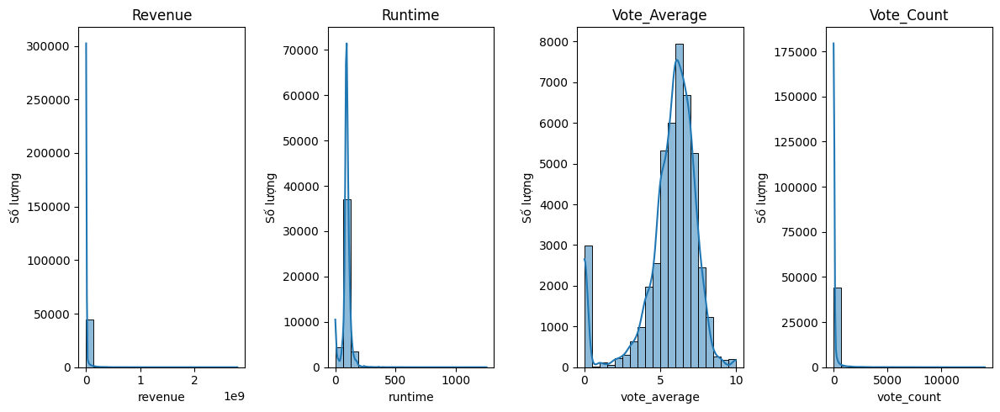

In [ ]:
visualize_numerical_data(df_movies)

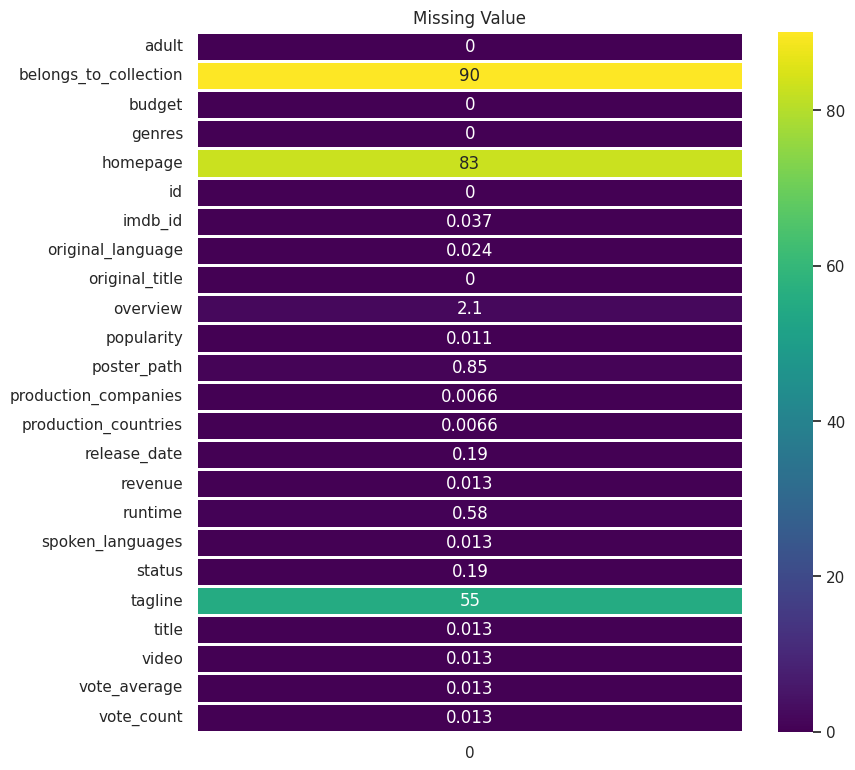

In [ ]:
plot_missing_values(df_movies)

- Có rất nhiều giá trị 0 trong cột 'revenue' và 'vote_count', có thể có nhiều lý do khác nhau mà giá trị này xuất hiện. Một trong những lý do phổ biến là trong quá trình thu thập dữ liệu, một số thông tin về doanh thu ('revenue') và số lượng phiếu bầu ('vote_count') có thể không được ghi nhận đúng và được điền bằng giá trị 0 thay vì giá trị thiếu (NaN).

- Tương tự với cột 'production_companies', trong quá trình thu thập dữ liệu, có thể có một số phim không có thông tin về các công ty sản xuất. Trong trường hợp này, giá trị [] có thể được sử dụng để thay thế cho giá trị thiếu (NaN).

- Các cột 'belongs_to_collection', 'homepage', 'tagline' có hơn 50% missing value

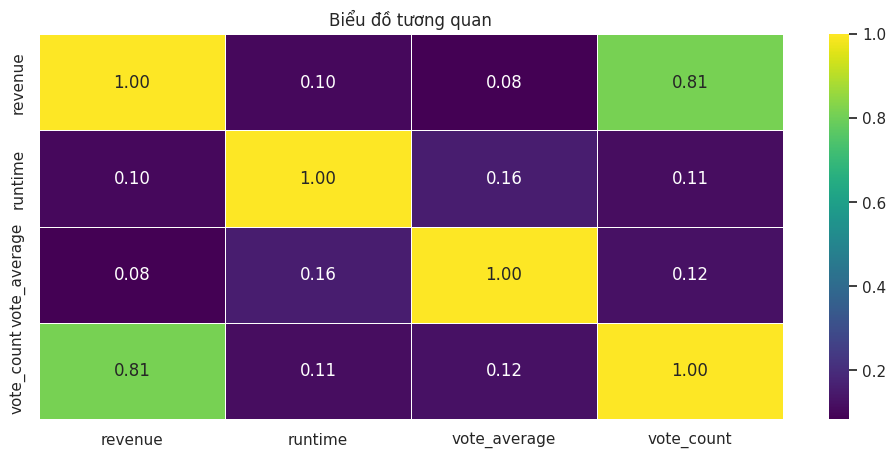

In [ ]:
plot_correlation_heatmap(df_movies)

**Tương quan giữa 'vote_count' và 'revenue':**  
- Độ tương quan giữa 'vote count' và 'revenue' là 0.81, điều này cho thấy có một mối tương quan tuyến tính mạnh giữa hai biến này. Giá trị 0.81 gần với 1, điều này chỉ ra rằng khi số lượng phiếu bầu ('vote count') tăng, doanh thu ('revenue') cũng có xu hướng tăng, và ngược lại.
- Mối tương quan mạnh này có thể được hiểu là:
  - Khi một bộ phim nhận được nhiều phiếu bầu, nó có thể thu hút sự chú ý và sự quan tâm từ khán giả, điều này có thể dẫn đến tăng cường doanh thu từ việc mọi người xem bộ phim.
  - Tuy nhiên, cần lưu ý rằng tương quan không có nghĩa là mối quan hệ nhân quả và không giải thích nguyên nhân của mối quan hệ này. Có thể có nhiều yếu tố khác nhau đồng thời ảnh hưởng đến cả 'vote count' và 'revenue'.

**Tương quan giữa 'vote_count' và 'vote_average':**  
- Giá trị 0.12 có thể chỉ ra rằng số lượng phiếu bầu ('vote count') không có tương quan mạnh với điểm đánh giá trung bình ('vote average'). Điều này có thể xảy ra khi một bộ phim có thể thu hút một số lượng lớn phiếu bầu nhưng có thể không nhất thiết có điểm đánh giá cao.
- Có thể có nhiều yếu tố khác nhau đóng vai trò trong quyết định của người xem khi đánh giá một bộ phim, không chỉ là lượng phiếu bầu.

**Tương quan giữa 'revenue' và 'vote_average':**  
- Giá trị 0.08 chỉ ra rằng doanh thu ('revenue') cũng không có tương quan mạnh với điểm đánh giá trung bình ('vote average'). Điều này có thể xảy ra khi một bộ phim có thể kiếm được nhiều doanh thu mà không nhất thiết phải có điểm đánh giá cao từ người xem.
- Một bộ phim có thể có doanh thu lớn do các yếu tố khác như chiến lược tiếp thị, dàn diễn viên nổi tiếng hoặc quảng cáo mạnh mẽ, mà không cần phải có sự đồng thuận cao từ người xem.

### credits dataframe

In [ ]:
df_credits.head()

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862


In [ ]:
df_credits.columns

Index(['cast', 'crew', 'id'], dtype='object')

**Feature**  
- cast: Thông tin về diễn viên. Tên diễn viên, giới tính và tên nhân vật mà họ đóng trong phim.

- crew: Thông tin về các thành viên đoàn làm phim. Chẳng hạn như người đạo diễn, biên tập viên và các vị trí khác.

- id: Đây là ID của bộ phim được cung cấp bởi TMDb (The Movie Database).

In [ ]:
info_df(df_credits)

Shape: 
 (45476, 3)

Có giá trị trùng lặp trong trường 'id'



,Non-Null Count,Dtype,Missing Percentage
Column,,,
cast,45476,object,0.0
crew,45476,object,0.0
id,45476,int64,0.0


In [ ]:
most_common_element_in_categorical_columns(df_credits)

Phần tử xuất hiện nhiều nhất trong mỗi cột categorical:


,Most Common Element,Count
Column,,
cast,[],2418
crew,[],771


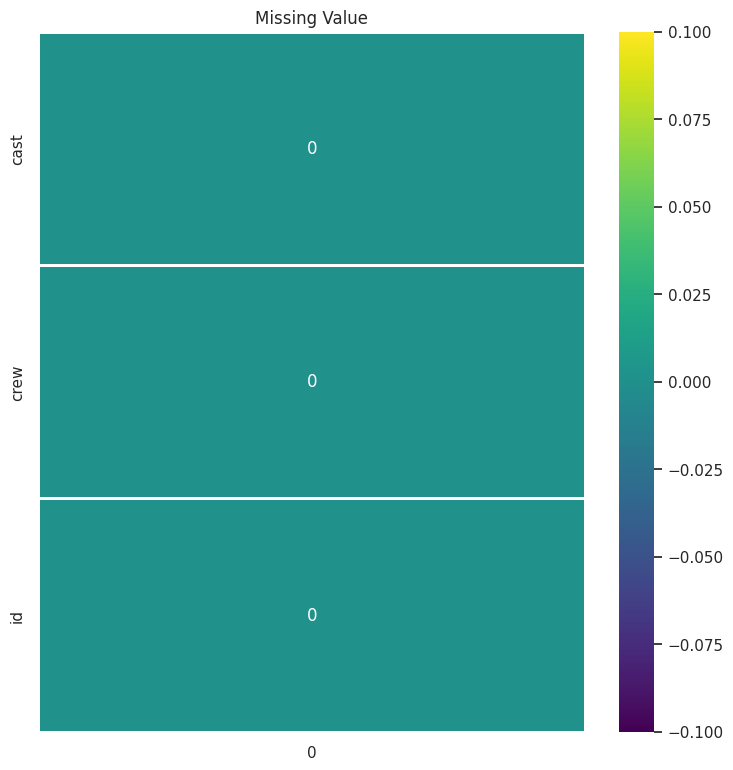

In [ ]:
plot_missing_values(df_credits)

Trong df_credits không có giá trị missing (NaN) trong các cột. Tuy nhiên, có nhiều giá trị []. Giá trị [] này biểu thị rằng cột đó không có giá trị.

Có một số lý do khác nhau khiến các giá trị [] xuất hiện trong df_credits. Một số lý do phổ biến bao gồm:

- Dữ liệu bị thiếu: Trong quá trình thu thập dữ liệu, có thể có một số phim không có thông tin về các thành viên trong đoàn làm phim. Trong trường hợp này, giá trị [] có thể được sử dụng để thay thế cho giá trị thiếu.
- Dữ liệu không chính xác: Trong một số trường hợp, thông tin về các thành viên trong đoàn làm phim có thể không chính xác. Ví dụ, một số phim có thể được báo cáo là không có bất kỳ thành viên nào trong đoàn làm phim, trong khi thực tế chúng có nhiều thành viên.
- Dữ liệu không có sẵn: Trong một số trường hợp, thông tin về các thành viên trong đoàn làm phim có thể không có sẵn cho công chúng. Ví dụ, thông tin này có thể được giữ bí mật bởi các nhà sản xuất hoặc các công ty truyền thông.

### keywords dataframe

In [ ]:
df_keywords.head()

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."


In [ ]:
df_keywords.columns

Index(['id', 'keywords'], dtype='object')

**Feature**  
- id: Đây là ID của bộ phim được cung cấp bởi TMDb (The Movie Database).

- keywords: Tags/keywords cho bộ phim. Đây là danh sách các từ khóa hoặc thẻ mô tả nội dung hoặc chủ đề của bộ phim.

In [ ]:
info_df(df_keywords)

Shape: 
 (46419, 2)

Có giá trị trùng lặp trong trường 'id'



,Non-Null Count,Dtype,Missing Percentage
Column,,,
id,46419,int64,0.0
keywords,46419,object,0.0


In [ ]:
most_common_element_in_categorical_columns(df_keywords)

Phần tử xuất hiện nhiều nhất trong mỗi cột categorical:


,Most Common Element,Count
Column,,
keywords,[],14795


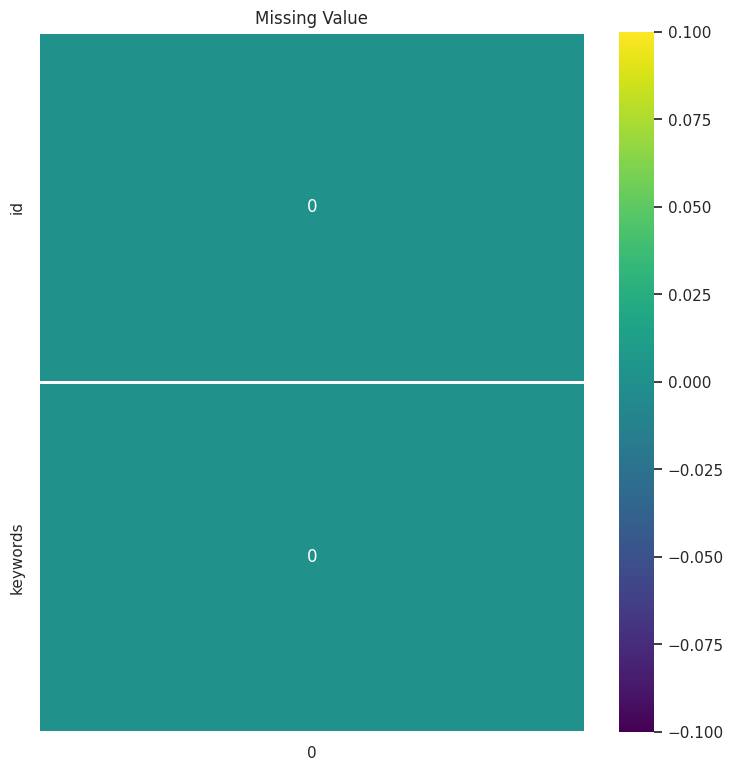

In [ ]:
plot_missing_values(df_keywords)

Trong df_keywords['keywords'] không có giá trị missing (NaN) trong các cột. Tuy nhiên, có nhiều giá trị []. Giá trị [] này biểu thị rằng cột đó không có giá trị.

### ratings dataframe

In [ ]:
df_ratings.head()

,userId,movieId,rating,timestamp
0,1,110.0,1.0,1.425942e+09
1,1,147.0,4.5,1.425942e+09
2,1,858.0,5.0,1.425942e+09
3,1,1221.0,5.0,1.425942e+09
4,1,1246.0,5.0,1.425942e+09


In [ ]:
df_ratings.columns

Index(['userId', 'movieId', 'rating', 'timestamp'], dtype='object')

**Feature**  
- userId: Đây là ID của người dùng.

- movieId: Đây là ID của bộ phim trên TMDb (The Movie Database).

- rating: Đánh giá được người dùng cụ thể đưa ra cho bộ phim tương ứng.

- timestamp: Thời điểm (timestamp) khi người dùng đưa ra đánh giá cho bộ phim.

In [ ]:
info_df(df_ratings)

Shape: 
 (15353609, 4)

Không có giá trị trùng lặp trong trường 'userID' và 'movieId'



,Non-Null Count,Dtype,Missing Percentage
Column,,,
userId,15353609,int64,0.000000
movieId,15353608,float64,0.000007
rating,15353608,float64,0.000007
timestamp,15353608,float64,0.000007


Do không có giá trị trùng lặp trong trường 'userID' và 'movieId'. Nên trong dataframe ratings không có user nào xem 1 bộ phim nhiều hơn 1 lần

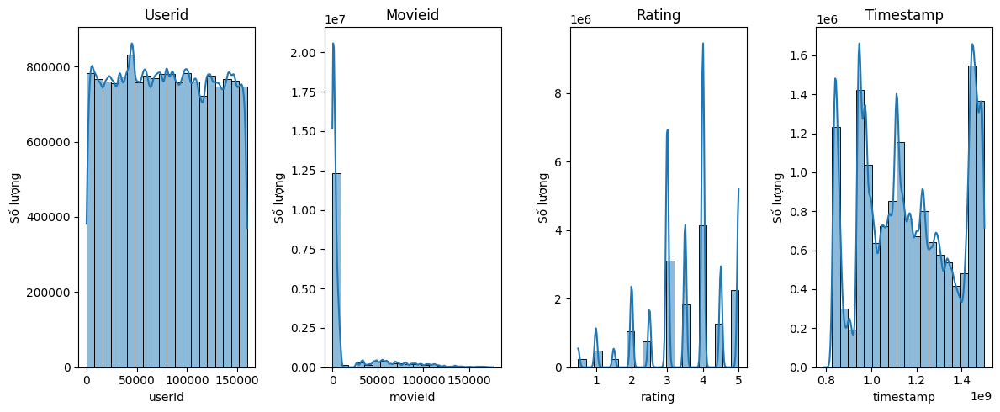

In [ ]:
visualize_numerical_data(df_ratings)

In [ ]:
# In ra 100 'title' được xếp theo thứ tự 'id' tăng dần
sorted_df = df_movies.sort_values(by='id')
selected_columns = ['title', 'vote_average', 'vote_count', 'runtime', 'release_date']
result_df = sorted_df[selected_columns].head(100)
result_df

,title,vote_average,vote_count,runtime,release_date
2429,"Lock, Stock and Two Smoking Barrels",7.5,1671.0,105.0,1998-03-05
13609,La estrategia del caracol,7.2,9.0,116.0,1993-12-25
4435,Young Einstein,4.5,46.0,91.0,1988-12-15
17451,Flight Command,6.0,1.0,116.0,1940-12-27
36946,Hounded,4.8,7.0,87.0,2006-08-06
...,...,...,...,...,...
4042,Get Over It,5.5,76.0,87.0,2001-03-08
11700,Avenue Montaigne,6.2,27.0,106.0,2006-02-15
4996,Dragonfly,6.2,209.0,104.0,2002-02-22
12373,Thunder Rock,7.3,3.0,112.0,1942-12-04


Số lượng người xem cho những phim có 'movieId' từ 0 đến 10000 là một con số lớn, đặc biệt nếu được so sánh với tổng số lượng người xem trong toàn bộ bộ dữ liệu hoặc với những phim có 'movieId' cao hơn.
Điều này có thể chỉ ra rằng nhóm các phim này có sức hấp dẫn lớn đối với khán giả, hoặc có thể được quảng bá mạnh mẽ.

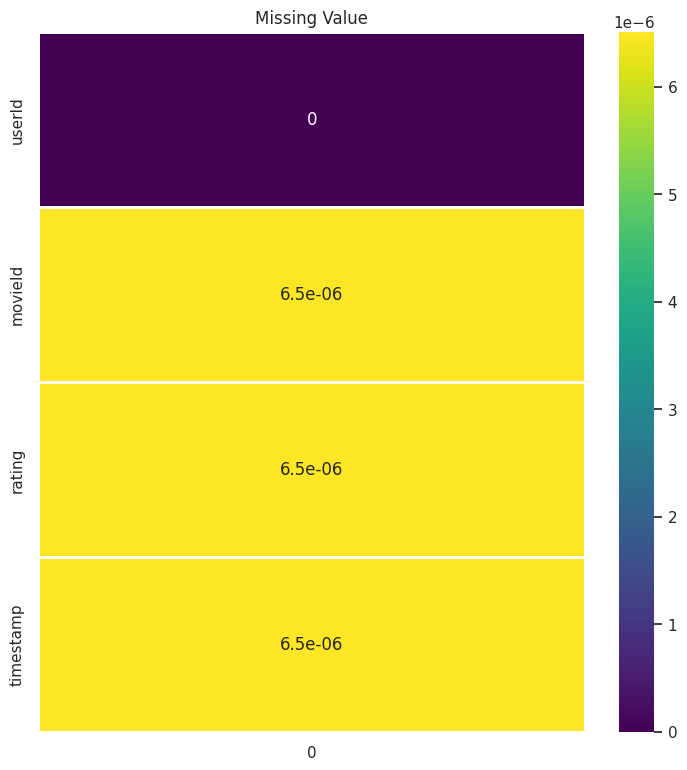

In [ ]:
plot_missing_values(df_ratings)

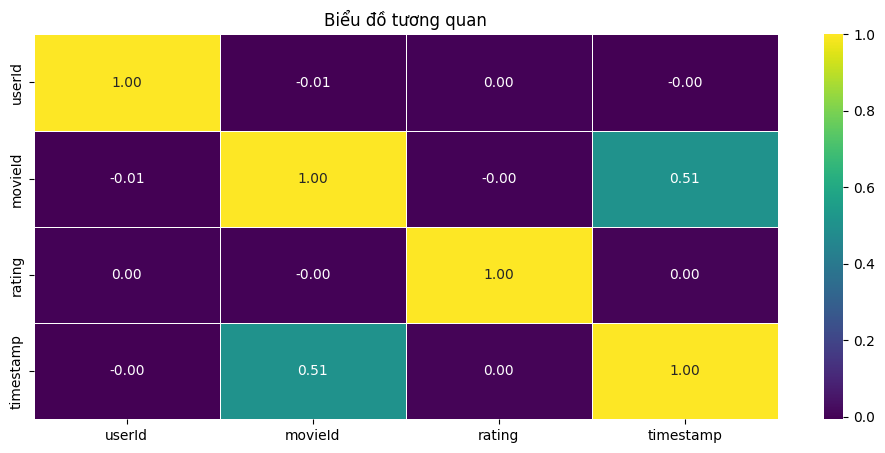

In [ ]:
plot_correlation_heatmap(df_ratings)

Độ tương quan giữa 'userId' và 'timestamp' là 0.51, điều này cho thấy có một mối tương quan tích cực tuyến tính giữa hai biến. Tăng giá trị của 'userId' thường đi kèm với sự tăng giảm của 'timestamp', và ngược lại.

Mối tương quan này có thể được giải thích bằng việc có nhiều người xem hơn theo thời gian, như bạn đã đề cập. Điều này có ý nghĩa là theo thời gian, số lượng người xem (có 'userId' khác nhau) đã tăng, điều này phản ánh sự phổ biến và sự tăng trưởng của dịch vụ xem phim.

In [ ]:
df=df_ratings

# Chuyển đổi cột 'timestamp' sang kiểu dữ liệu ngày giờ
df['timestamp'] = pd.to_datetime(df['timestamp'], unit='s')  # Giả sử 'timestamp' đang ở đơn vị giây

# Tách cột 'timestamp' thành 'ngày' và 'giờ'
df['day'] = df['timestamp'].dt.date
df['time'] = df['timestamp'].dt.time
df['hour'] = df['timestamp'].dt.hour

In [ ]:
df.head()

,userId,movieId,rating,timestamp,day,time,hour
0,1,110.0,1.0,2015-03-09 22:52:09,2015-03-09,22:52:09,22.0
1,1,147.0,4.5,2015-03-09 23:07:15,2015-03-09,23:07:15,23.0
2,1,858.0,5.0,2015-03-09 22:52:03,2015-03-09,22:52:03,22.0
3,1,1221.0,5.0,2015-03-09 22:52:26,2015-03-09,22:52:26,22.0
4,1,1246.0,5.0,2015-03-09 22:52:36,2015-03-09,22:52:36,22.0


Text(0.5, 0, 'Giờ trong ngày')

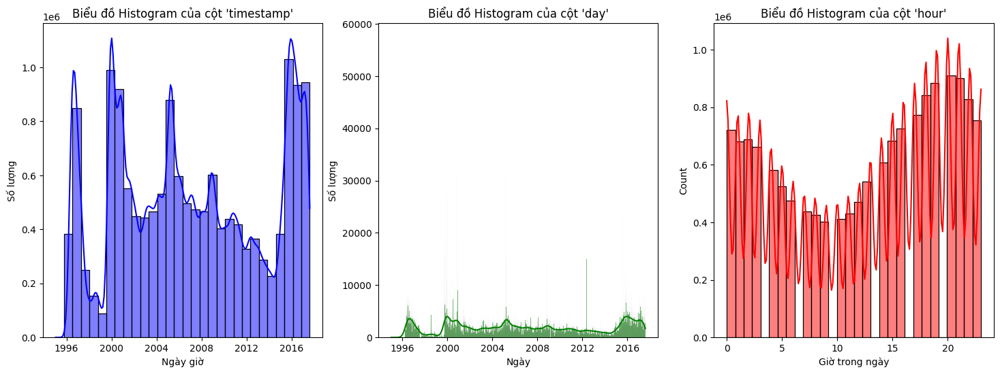

In [ ]:
# Tạo subplot cho cột 'timestamp', 'day', và 'hour'
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Biểu đồ histogram cho cột 'timestamp'
sns.histplot(df['timestamp'], bins=30, kde=True, color='blue', ax=axes[0])
axes[0].set_title("Biểu đồ Histogram của cột 'timestamp'")
axes[0].set_xlabel('Ngày giờ')
axes[0].set_ylabel('Số lượng')

# Biểu đồ histogram cho cột 'day'
sns.histplot(df['day'], bins=30, kde=True, color='green', ax=axes[1])
axes[1].set_title("Biểu đồ Histogram của cột 'day'")
axes[1].set_xlabel('Ngày')
axes[1].set_ylabel('Số lượng')

# Biểu đồ histogram cho cột 'hour'
sns.histplot(df['hour'], bins=30, kde=True, color='red', ax=axes[2])
axes[2].set_title("Biểu đồ Histogram của cột 'hour'")
axes[2].set_xlabel('Giờ trong ngày')

Dựa trên phân phối thời gian của ngày giờ xem phim, bạn có thể đưa ra những nhận xét hợp lý về thói quen xem phim của người dùng. Dưới đây là một số nhận xét có thể áp dụng:

Khung giờ xem phim: Nếu có một đỉnh lớn tại các giờ tối, có thể người xem thường xem phim vào buổi tối sau khi kết thúc công việc hoặc các hoạt động hàng ngày. Điều này có thể phản ánh thói quen giải trí sau giờ làm việc.

Mùa trong năm: Nếu có sự tăng đột ngột trong lượng xem phim ở cuối năm hoặc mùa hè, có thể đó là thời điểm mà người xem thường có nhiều thời gian rảnh hơn, chẳng hạn như trong kỳ nghỉ lễ hoặc kỳ nghỉ mùa hè.

Ngày trong tuần: Bạn cũng có thể xem xét thói quen xem phim trong các ngày cụ thể của tuần. Có thể có sự gia tăng vào cuối tuần khi mọi người có nhiều thời gian rảnh hơn so với các ngày trong tuần.

# **Preprocessing Data**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from ast import literal_eval
import warnings; warnings.simplefilter('ignore')
pd.set_option('display.max_columns', None)

## Preprocessing

### movie_metadata dataframe

##### Read

In [ ]:
meta = pd.read_csv('movies_metadata.csv', encoding='utf-8')
meta

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45461,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10751, 'n...",http://www.imdb.com/title/tt6209470/,439050,tt6209470,fa,رگ خواب,Rising and falling between a man and woman.,0.072051,/jldsYflnId4tTWPx8es3uzsB1I8.jpg,[],"[{'iso_3166_1': 'IR', 'name': 'Iran'}]",NaN,0.0,90.0,"[{'iso_639_1': 'fa', 'name': 'فارسی'}]",Released,Rising and falling between a man and woman,Subdue,False,4.0,1.0
45462,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,111109,tt2028550,tl,Siglo ng Pagluluwal,An artist struggles to finish his work while a...,0.178241,/xZkmxsNmYXJbKVsTRLLx3pqGHx7.jpg,"[{'name': 'Sine Olivia', 'id': 19653}]","[{'iso_3166_1': 'PH', 'name': 'Philippines'}]",2011-11-17,0.0,360.0,"[{'iso_639_1': 'tl', 'name': ''}]",Released,NaN,Century of Birthing,False,9.0,3.0
45463,False,NaN,0,"[{'id': 28, 'name': 'Action'}, {'id': 18, 'nam...",NaN,67758,tt0303758,en,Betrayal,"When one of her hits goes wrong, a professiona...",0.903007,/d5bX92nDsISNhu3ZT69uHwmfCGw.jpg,"[{'name': 'American World Pictures', 'id': 6165}]","[{'iso_3166_1': 'US', 'name': 'United States o...",2003-08-01,0.0,90.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,A deadly game of wits.,Betrayal,False,3.8,6.0
45

##### Year

In [ ]:
meta['release_date'] = pd.to_datetime(meta['release_date'], errors='coerce')
meta['year'] = meta['release_date'].dt.year
meta['year'].value_counts().sort_index()

year
1874.0       1
1878.0       1
1883.0       1
1887.0       1
1888.0       2
          ... 
2015.0    1905
2016.0    1604
2017.0     532
2018.0       5
2020.0       1
Name: count, Length: 135, dtype: int64

##### Adult

In [ ]:
print(*(i for i in meta['adult'].unique()), sep="\n")

False
True
 - Written by Ørnås
 Rune Balot goes to a casino connected to the October corporation to try to wrap up her case once and for all.
 Avalanche Sharks tells the story of a bikini contest that turns into a horrifying affair when it is hit by a shark avalanche.


Ánh xạ chuỗi 'True' hoặc 'False' trong meta['adult'] về thành kiểu boolean.

Nếu meta['adult'] không phải True hoặc False thì drop do dòng đó các giá trị trong dòng đó đảo lộn trật tự  

In [ ]:
meta['adult'] = meta['adult'].map({'True': True, 'False': False})
meta.drop(meta[~meta['adult'].isin([True, False])].index, inplace=True)

##### original_language

In [ ]:
meta['original_language'].unique()

array(['en', 'fr', 'zh', 'it', 'fa', 'nl', 'de', 'cn', 'ar', 'es', 'ru',
       'sv', 'ja', 'ko', 'sr', 'bn', 'he', 'pt', 'wo', 'ro', 'hu', 'cy',
       'vi', 'cs', 'da', 'no', 'nb', 'pl', 'el', 'sh', 'xx', 'mk', 'bo',
       'ca', 'fi', 'th', 'sk', 'bs', 'hi', 'tr', 'is', 'ps', 'ab', 'eo',
       'ka', 'mn', 'bm', 'zu', 'uk', 'af', 'la', 'et', 'ku', 'fy', 'lv',
       'ta', 'sl', 'tl', 'ur', 'rw', 'id', 'bg', 'mr', 'lt', 'kk', 'ms',
       'sq', nan, 'qu', 'te', 'am', 'jv', 'tg', 'ml', 'hr', 'lo', 'ay',
       'kn', 'eu', 'ne', 'pa', 'ky', 'gl', 'uz', 'sm', 'mt', 'hy', 'iu',
       'lb', 'si'], dtype=object)

In [ ]:
(meta['original_language'] == 'en').sum()

32269

Chỉ lấy những movies có original_language là tiếng Anh

In [ ]:
meta = meta[meta['original_language'] == 'en']
meta = meta.reset_index(drop=True)

##### Status & Video

In [ ]:
meta['status'].unique()

array(['Released', nan, 'Rumored', 'Post Production', 'In Production',
       'Planned', 'Canceled'], dtype=object)

In [ ]:
print(*(i for i in meta['video'].unique()), sep="\n")


False
True
nan


##### Budget, runtime, popularity, revenue, vote_count, vote_average

với budget <= 0 chuyển thành np.nan
làm tương tự với runtime, popularity, revenue, vote_count, vote_average

In [ ]:
meta['budget'] = meta['budget'].astype(str).apply(lambda x: int(x) if x.isdigit() else np.nan)
meta['popularity'] = pd.to_numeric(meta['popularity'], errors='coerce')

In [ ]:
list_cols=['budget','runtime','popularity','revenue','vote_count','vote_average']
for i in list_cols:
    meta.loc[meta[i] <= 0, i] = np.nan

##### genres

In [ ]:
meta['genres_list'] = meta['genres'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
meta['genres_list'] = meta['genres_list'].apply(lambda x: x if x else ['other'])

##### production_companies & production_countries

In [ ]:
meta['production_countries'] = meta['production_countries'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
meta['production_countries'] = meta['production_countries'].apply(lambda x: x if x else ['other'])

meta['production_companies'] = meta['production_companies'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
meta['production_companies'] = meta['production_companies'].apply(lambda x: x if x else ['other'])

#### New data

In [ ]:
meta.isnull().sum()

adult                        0
belongs_to_collection    29156
budget                   24835
genres                       0
homepage                 26103
id                           0
imdb_id                     13
original_language            0
original_title               0
overview                    69
popularity                  50
poster_path                323
production_companies         0
production_countries         0
release_date                67
revenue                  25913
runtime                    757
spoken_languages             2
status                      70
tagline                  14336
title                        2
video                        2
vote_average              2252
vote_count                2165
year                        67
genres_list                  0
dtype: int64

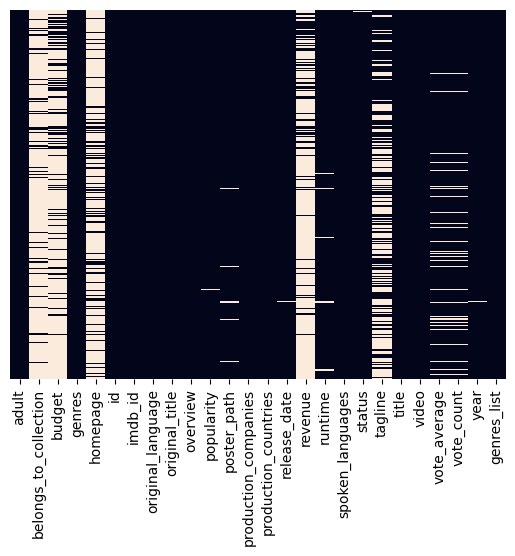

In [ ]:
_ = sns.heatmap(meta.isnull(), yticklabels=False, cbar=False)

In [ ]:
new = meta.drop(columns = ['imdb_id', 'adult', 'video', 'status', 'belongs_to_collection','budget', 'homepage', 'original_title', 'overview', 'spoken_languages', 'tagline', 'release_date', 'original_language', 'poster_path', 'revenue', 'genres'])
new.head()

,id,popularity,production_companies,production_countries,runtime,title,vote_average,vote_count,year,genres_list
0,862,21.946943,[Pixar Animation Studios],[United States of America],81.0,Toy Story,7.7,5415.0,1995.0,"[Animation, Comedy, Family]"
1,8844,17.015539,"[TriStar Pictures, Teitler Film, Interscope Co...",[United States of America],104.0,Jumanji,6.9,2413.0,1995.0,"[Adventure, Fantasy, Family]"
2,15602,11.712900,"[Warner Bros., Lancaster Gate]",[United States of America],101.0,Grumpier Old Men,6.5,92.0,1995.0,"[Romance, Comedy]"
3,31357,3.859495,[Twentieth Century Fox Film Corporation],[United States of America],127.0,Waiting to Exhale,6.1,34.0,1995.0,"[Comedy, Drama, Romance]"
4,11862,8.387519,"[Sandollar Productions, Touchstone Pictures]",[United States of America],106.0,Father of the Bride Part II,5.7,173.0,1995.0,[Comedy]


### credits dataframe

##### Read

In [ ]:
credits = pd.read_csv('credits.csv', encoding='utf-8')
credits

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862
...,...,...,...
45471,"[{'cast_id': 0, 'character': '', 'credit_id': ...","[{'credit_id': '5894a97d925141426c00818c', 'de...",439050
45472,"[{'cast_id': 1002, 'character': 'Sister Angela...","[{'credit_id': '52fe4af1c3a36847f81e9b15', 'de...",111109
45473,"[{'cast_id': 6, 'character': 'Emily Shaw', 'cr...","[{'credit_id': '52fe4776c3a368484e0c8387', 'de...",67758
45474,"[{'cast_id': 2, 'character': '', 'credit_id': ...","[{'credit_id': '533bccebc3a36844cf0011a7', 'de...",227506


##### Actors

In [ ]:
credits['actor'] = credits['cast'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x[:5]] if isinstance(x, list) else [])
credits['actor'] = credits['actor'].apply(lambda x: x if x else ['unknown'])

##### Director

In [ ]:
def get_director(x):
    for i in x:
        if i['job'] == 'Director':
            return i['name']
    return 'unknown'

In [ ]:
credits['director_name'] = credits['crew'].apply(literal_eval).map(lambda x: get_director(x))

##### new

In [ ]:
credits = credits.drop(columns = ['cast', 'crew'])
credits.head()

,id,actor,director_name
0,862,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...",John Lasseter
1,8844,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...",Joe Johnston
2,15602,"[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...",Howard Deutch
3,31357,"[Whitney Houston, Angela Bassett, Loretta Devi...",Forest Whitaker
4,11862,"[Steve Martin, Diane Keaton, Martin Short, Kim...",Charles Shyer


### keywords dataframe

In [ ]:
key=pd.read_csv('keywords.csv')
key=key.drop_duplicates(subset='id', keep='first')
key

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."
...,...,...
46414,439050,"[{'id': 10703, 'name': 'tragic love'}]"
46415,111109,"[{'id': 2679, 'name': 'artist'}, {'id': 14531,..."
46416,67758,[]
46417,227506,[]


In [ ]:
key['keywords'] = key['keywords'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
key['keywords'] = key['keywords'].apply(lambda x: x if x else ['other'])


In [ ]:
key

,id,keywords
0,862,"[jealousy, toy, boy, friendship, friends, riva..."
1,8844,"[board game, disappearance, based on children'..."
2,15602,"[fishing, best friend, duringcreditsstinger, o..."
3,31357,"[based on novel, interracial relationship, sin..."
4,11862,"[baby, midlife crisis, confidence, aging, daug..."
...,...,...
46414,439050,[tragic love]
46415,111109,"[artist, play, pinoy]"
46416,67758,[other]
46417,227506,[other]


## Full data

In [ ]:
new['id'] = meta['id'].astype(int)
merge_movies = pd.merge(new, credits, on='id', how='inner')
merge_movies = pd.merge(merge_movies, key, on='id', how='inner')
merge_movies.drop_duplicates(subset='id', keep='first', inplace=True)
merge_movies

,id,popularity,production_companies,production_countries,runtime,title,vote_average,vote_count,year,genres_list,actor,director_name,keywords
0,862,21.946943,[Pixar Animation Studios],[United States of America],81.0,Toy Story,7.7,5415.0,1995.0,"[Animation, Comedy, Family]","[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...",John Lasseter,"[jealousy, toy, boy, friendship, friends, riva..."
1,8844,17.015539,"[TriStar Pictures, Teitler Film, Interscope Co...",[United States of America],104.0,Jumanji,6.9,2413.0,1995.0,"[Adventure, Fantasy, Family]","[Robin Williams, Jonathan Hyde, Kirsten Dunst,...",Joe Johnston,"[board game, disappearance, based on children'..."
2,15602,11.712900,"[Warner Bros., Lancaster Gate]",[United States of America],101.0,Grumpier Old Men,6.5,92.0,1995.0,"[Romance, Comedy]","[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...",Howard Deutch,"[fishing, best friend, duringcreditsstinger, o..."
3,31357,3.859495,[Twentieth Century Fox Film Corporation],[United States of America],127.0,Waiting to Exhale,6.1,34.0,1995.0,"[Comedy, Drama, Romance]","[Whitney Houston, Angela Bassett, Loretta Devi...",Forest Whitaker,"[based on novel, interracial relationship, sin..."
4,11862,8.387519,"[Sandollar Productions, Touchstone Pictures]",[United States of America],106.0,Father of the Bride Part II,5.7,173.0,1995.0,[Comedy],"[Steve Martin, Diane Keaton, Martin Short, Kim...",Charles Shyer,"[baby, midlife crisis, confidence, aging, daug..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32311,222848,0.661558,[Concorde-New Horizons],[United States of America],85.0,Caged Heat 3000,3.5,1.0,1995.0,[Science Fiction],"[Lisa Boyle, Kena Land, Zaneta Polard, Don Yan...",Aaron Osborne,[other]
32312,30840,5.683753,"[Westdeutscher Rundfunk (WDR), Working Title F...","[Canada, Germany, United Kingdom, United State...",104.0,Robin Hood,5.7,26.0,1991.0,"[Drama, Action, Romance]","[Patrick Bergin, Uma Thurman, David Morrissey,...",John Irvin,[other]
32313,67758,0.903007,[American World Pictures],[United States of America],90.0,Betrayal,3.8,6.0,2003.0,"[Action, Drama, Thriller]","[Erika Eleniak, Adam Baldwin, Julie du Page, J...",Mark L. Lester,[other]
32314,227506,0.003503,[Yermoliev],[Russia],87.0,Satan Triumphant,NaN,NaN,1917.0,[other],"[Iwan Mosschuchin, Nathalie Lissenko, Pavel Pa...",Yakov Protazanov,[other]


In [ ]:
merge_movies.isnull().sum()

id                         0
popularity                50
production_companies       0
production_countries       0
runtime                  757
title                      2
vote_average            2250
vote_count              2163
year                      67
genres_list                0
actor                      0
director_name              0
keywords                   0
dtype: int64

In [ ]:
merge_movies = merge_movies.dropna()
merge_movies

,id,popularity,production_companies,production_countries,runtime,title,vote_average,vote_count,year,genres_list,actor,director_name,keywords
0,862,21.946943,[Pixar Animation Studios],[United States of America],81.0,Toy Story,7.7,5415.0,1995.0,"[Animation, Comedy, Family]","[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...",John Lasseter,"[jealousy, toy, boy, friendship, friends, riva..."
1,8844,17.015539,"[TriStar Pictures, Teitler Film, Interscope Co...",[United States of America],104.0,Jumanji,6.9,2413.0,1995.0,"[Adventure, Fantasy, Family]","[Robin Williams, Jonathan Hyde, Kirsten Dunst,...",Joe Johnston,"[board game, disappearance, based on children'..."
2,15602,11.712900,"[Warner Bros., Lancaster Gate]",[United States of America],101.0,Grumpier Old Men,6.5,92.0,1995.0,"[Romance, Comedy]","[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...",Howard Deutch,"[fishing, best friend, duringcreditsstinger, o..."
3,31357,3.859495,[Twentieth Century Fox Film Corporation],[United States of America],127.0,Waiting to Exhale,6.1,34.0,1995.0,"[Comedy, Drama, Romance]","[Whitney Houston, Angela Bassett, Loretta Devi...",Forest Whitaker,"[based on novel, interracial relationship, sin..."
4,11862,8.387519,"[Sandollar Productions, Touchstone Pictures]",[United States of America],106.0,Father of the Bride Part II,5.7,173.0,1995.0,[Comedy],"[Steve Martin, Diane Keaton, Martin Short, Kim...",Charles Shyer,"[baby, midlife crisis, confidence, aging, daug..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32309,390959,0.076061,[other],[other],45.0,Shadow of the Blair Witch,7.0,2.0,2000.0,"[Mystery, Horror]","[Tony Abatemarco, Andre Brooks, Mariclare Cost...",Ben Rock,[blair witch]
32310,289923,0.386450,"[Neptune Salad Entertainment, Pirie Productions]",[United States of America],30.0,The Burkittsville 7,7.0,1.0,2000.0,[Horror],"[Monty Bane, Lucy Butler, David Grammer, Bill ...",Ben Rock,"[witch, mythology, legend, serial killer, mock..."
32311,222848,0.661558,[Concorde-New Horizons],[United States of America],85.0,Caged Heat 3000,3.5,1.0,1995.0,[Science Fiction],"[Lisa Boyle, Kena Land, Zaneta Polard, Don Yan...",Aaron Osborne,[other]
32312,30840,5.683753,"[Westdeutscher Rundfunk (WDR), Working Title F...","[Canada, Germany, United Kingdom, United State...",104.0,Robin Hood,5.7,26.0,1991.0,"[Drama, Action, Romance]","[Patrick Bergin, Uma Thurman, David Morrissey,...",John Irvin,[other]


In [ ]:
merge_movies.to_csv('data.csv', index=False)

## Visualize

In [ ]:
def get_counts(data, col):
    counts = {}
    for _, row in data.iterrows():
        if isinstance(row[col], list):
            genres = row[col]
            for genre in genres:
                if genre in counts:
                    counts[genre] += 1
                else:
                    counts[genre] = 1
    return counts

In [ ]:
# Get the base counts of each category and sort them by counts
base_counts = get_counts(merge_movies, 'genres_list')
base_counts = pd.DataFrame(index=base_counts.keys(), data=base_counts.values(), columns=['Counts'])
base_counts.sort_values(by='Counts', inplace=True)

# Plot the chart which shows top genres and separate by color where genre<1000
colors = ['#abaeab' if count < 1000 else '#A0E045' for count in base_counts['Counts']]
fig = px.bar(x=base_counts.index, y=base_counts['Counts'], title='Most Popular Genre', color_discrete_sequence=colors, color=base_counts.index)
fig.show()

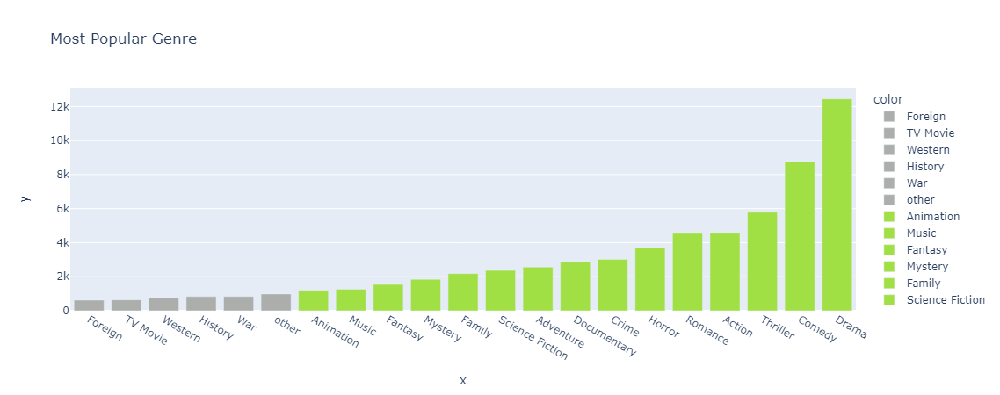

In [ ]:
def plot_value_counts_bar(data, col):
    vc = data[col].value_counts().reset_index()
    fig = px.bar(vc, y='count', x=col, color='count', title=col)
    return fig

In [ ]:
plot_value_counts_bar(merge_movies,'year')

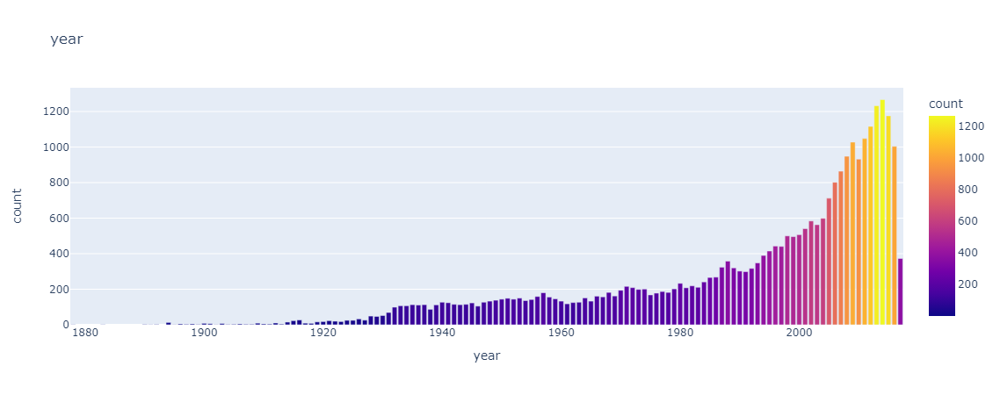

In [ ]:
import math
def get_ratings(data, col, ratings_col):
    base_counts = get_counts(data, col)
    category_ratings = {}
    a = {}

    for _, row in data.iterrows():
        if isinstance(row[col], list):
            genres = row[col]
            for genre in genres:
                if not math.isnan(row['vote_count']):
                    if genre in category_ratings:
                        category_ratings[genre] += row[ratings_col]
                    else:
                        category_ratings[genre] = row[ratings_col]
    for genre in base_counts:
        a[genre] = round(category_ratings[genre] / base_counts[genre], 2)
    return a

In [ ]:
base_counts = get_ratings(merge_movies, 'genres_list', 'vote_count')
base_counts = pd.DataFrame(index=base_counts.keys(),
                           data=base_counts.values(),
                           columns=['Counts'])
base_counts.sort_values(by='Counts', inplace=True)
fig = px.pie(names=base_counts.index,
             values=base_counts['Counts'],
             title='Most Popular Genre by Votes',
             color=base_counts.index)
fig.show()

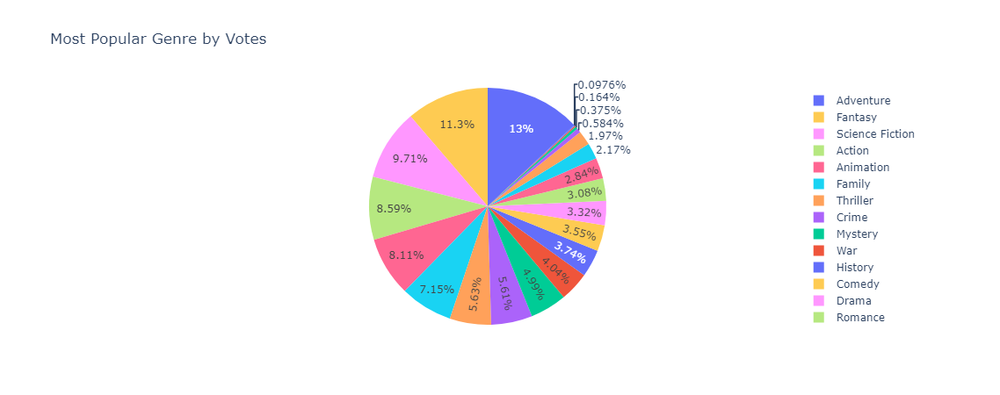

# **Building Model**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ast import literal_eval
import builtins

import json
from itertools import islice

from sklearn import preprocessing
from lightfm.evaluation import auc_score, precision_at_k
from lightfm import LightFM
from lightfm.data import Dataset
from lightfm import cross_validation
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

## **Model 1: Simple Recommender**

In [ ]:
df_movie_features = pd.read_csv('./data/data_movies_features.csv', encoding='utf_8')
df_movie_features.head()

,id,original_language,popularity,runtime,title,vote_average,vote_count,year,genres_list,production_companies_list,actor,director_name,keywords
0,862,en,21.946943,81.0,Toy Story,7.7,5415.0,1995.0,"['Animation', 'Comedy', 'Family']",Pixar Animation Studios,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim...",John Lasseter,"['jealousy', 'toy', 'boy', 'friendship', 'frie..."
1,8844,en,17.015539,104.0,Jumanji,6.9,2413.0,1995.0,"['Adventure', 'Fantasy', 'Family']",TriStar Pictures Teitler Film Interscope Commu...,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",Joe Johnston,"['board game', 'disappearance', ""based on chil..."
2,15602,en,11.712900,101.0,Grumpier Old Men,6.5,92.0,1995.0,"['Romance', 'Comedy']",Warner Bros. Lancaster Gate,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret...",Howard Deutch,"['fishing', 'best friend', 'duringcreditssting..."
3,31357,en,3.859495,127.0,Waiting to Exhale,6.1,34.0,1995.0,"['Comedy', 'Drama', 'Romance']",Twentieth Century Fox Film Corporation,"['Whitney Houston', 'Angela Bassett', 'Loretta...",Forest Whitaker,"['based on novel', 'interracial relationship',..."
4,11862,en,8.387519,106.0,Father of the Bride Part II,5.7,173.0,1995.0,['Comedy'],Sandollar Productions Touchstone Pictures,"['Steve Martin', 'Diane Keaton', 'Martin Short...",Charles Shyer,"['baby', 'midlife crisis', 'confidence', 'agin..."


In [ ]:
m = df_movie_features['vote_count'].quantile(0.95)
C = df_movie_features['vote_average'].mean()

In [ ]:
def weighted_rating(x):
    v = x['vote_count']
    R = x['vote_average']
    return (v/(v+m) * R) + (m/(m+v) * C)

In [ ]:
df_movie_features['genres_list'] = df_movie_features['genres_list'].apply(eval)
s = df_movie_features.apply(lambda x: pd.Series(x['genres_list']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'genre'
gen_md = df_movie_features.drop('genres_list', axis=1).join(s)

In [ ]:
def build_chart(genre, percentile=0.85):
    df = gen_md[gen_md['genre'] == genre]
    vote_counts = df[df['vote_count'].notnull()]['vote_count'].astype('int')
    vote_averages = df[df['vote_average'].notnull()]['vote_average'].astype('int')
    C = vote_averages.mean()
    m = vote_counts.quantile(percentile)

    qualified = df[(df['vote_count'] >= m) & (df['vote_count'].notnull()) & (df['vote_average'].notnull())][['title', 'year', 'vote_count', 'vote_average', 'popularity']]
    qualified['vote_count'] = qualified['vote_count'].astype('int')
    qualified['vote_average'] = qualified['vote_average'].astype('int')

    # qualified['wr'] = qualified.apply(lambda x: (x['vote_count']/(x['vote_count']+m) * x['vote_average']) + (m/(m+x['vote_count']) * C), axis=1)
    qualified['wr'] = qualified.apply(weighted_rating, axis=1)
    qualified = qualified.sort_values('wr', ascending=False).head(250)

    return qualified

In [ ]:
build_chart('Animation')

,title,year,vote_count,vote_average,popularity,wr
300,The Lion King,1994.0,5520,8,21.605761,7.686761
9511,Up,2009.0,7048,7,19.330884,6.868372
17376,Inside Out,2015.0,6737,7,23.985587,6.863067
10447,Despicable Me,2010.0,6595,7,22.274502,6.860500
8920,WALL·E,2008.0,6439,7,16.088366,6.857566
...,...,...,...,...,...,...
8084,Happy Feet,2006.0,1457,5,15.088318,5.370165
6165,Shark Tale,2004.0,1612,5,17.999273,5.348022
11384,Cars 2,2011.0,2088,5,13.693002,5.294013
20066,Sausage Party,2016.0,2310,5,17.569630,5.274169


The recommended genre is 'Animation'  
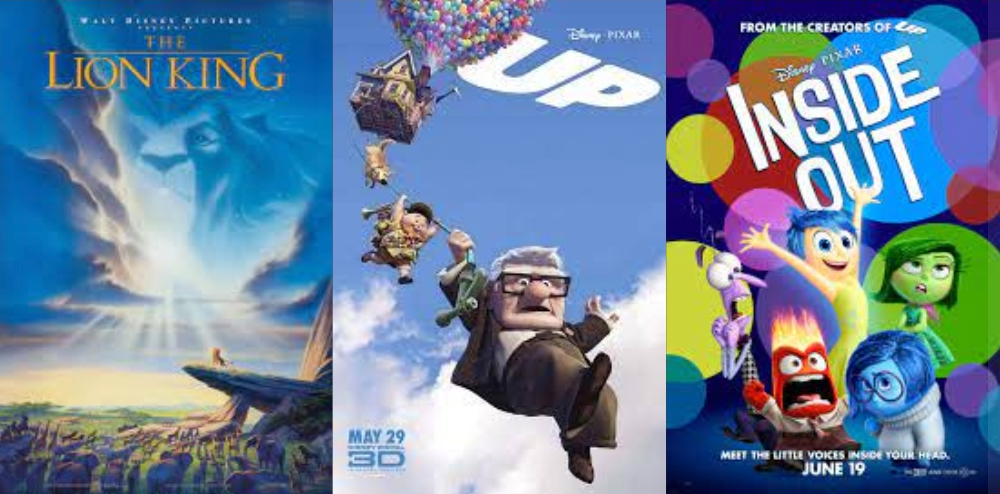

## **Model 2: Content Based Recommender**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
def create_soup(x):
    return ' '.join(x['keywords']) + ' ' + ' '.join(x['actor']) + ' ' + x['director_name'] + ' ' + ' '.join(x['genres_list'])+ ' ' + ' '.join(x['title'])

In [ ]:
df_movie_features['soup'] = df_movie_features.apply(create_soup, axis=1)
df_movie_features.head()

,id,original_language,popularity,runtime,title,vote_average,vote_count,year,genres_list,production_companies_list,actor,director_name,keywords,soup
0,862,en,21.946943,81.0,Toy Story,7.7,5415.0,1995.0,"[Animation, Comedy, Family]",Pixar Animation Studios,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim...",John Lasseter,"['jealousy', 'toy', 'boy', 'friendship', 'frie...","[ ' j e a l o u s y ' , ' t o y ' , ' b o ..."
1,8844,en,17.015539,104.0,Jumanji,6.9,2413.0,1995.0,"[Adventure, Fantasy, Family]",TriStar Pictures Teitler Film Interscope Commu...,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",Joe Johnston,"['board game', 'disappearance', ""based on chil...","[ ' b o a r d g a m e ' , ' d i s a p p e ..."
2,15602,en,11.712900,101.0,Grumpier Old Men,6.5,92.0,1995.0,"[Romance, Comedy]",Warner Bros. Lancaster Gate,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret...",Howard Deutch,"['fishing', 'best friend', 'duringcreditssting...","[ ' f i s h i n g ' , ' b e s t f r i e n ..."
3,31357,en,3.859495,127.0,Waiting to Exhale,6.1,34.0,1995.0,"[Comedy, Drama, Romance]",Twentieth Century Fox Film Corporation,"['Whitney Houston', 'Angela Bassett', 'Loretta...",Forest Whitaker,"['based on novel', 'interracial relationship',...","[ ' b a s e d o n n o v e l ' , ' i n t ..."
4,11862,en,8.387519,106.0,Father of the Bride Part II,5.7,173.0,1995.0,[Comedy],Sandollar Productions Touchstone Pictures,"['Steve Martin', 'Diane Keaton', 'Martin Short...",Charles Shyer,"['baby', 'midlife crisis', 'confidence', 'agin...","[ ' b a b y ' , ' m i d l i f e c r i s i ..."


In [ ]:
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(df_movie_features['soup'])

cosine_sim = cosine_similarity(count_matrix, count_matrix)

In [ ]:
df_movie_features = df_movie_features.reset_index()
indices = pd.Series(df_movie_features.index, index=df_movie_features['title'])

In [ ]:
def get_recommendations(titles, cosine_sim=cosine_sim):
    id = indices.get(titles, None)
    if (id is None):
        a=df_movie_features.query('title.str.contains(@titles)').sort_values(by=['vote_average', 'vote_count'], ascending=False).reset_index()
        id = indices[a['title'][0]]
    if (id.shape != ()):
        id = id[0]

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[id]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return df_movie_features[['id', 'title', 'director_name', 'actor', 'genres_list', 'keywords']].iloc[movie_indices]

In [ ]:
get_recommendations('Harry Potter', cosine_sim)

,id,title,director_name,actor,genres_list,keywords
10784,12444,Harry Potter and the Deathly Hallows: Part 1,David Yates,"['Daniel Radcliffe', 'Emma Watson', 'Rupert Gr...","[Adventure, Fantasy, Family]","['corruption', 'isolation', 'radio', 'magic', ..."
11417,12445,Harry Potter and the Deathly Hallows: Part 2,David Yates,"['Daniel Radcliffe', 'Rupert Grint', 'Emma Wat...","[Family, Fantasy, Adventure]","['self sacrifice', 'magic', 'frog', 'sorcerer'..."
17398,259316,Fantastic Beasts and Where to Find Them,David Yates,"['Eddie Redmayne', 'Colin Farrell', 'Katherine...","[Adventure, Family, Fantasy]","['robbery', 'magic', 'teleportation', 'suitcas..."
8423,675,Harry Potter and the Order of the Phoenix,David Yates,"['Daniel Radcliffe', 'Rupert Grint', 'Emma Wat...","[Adventure, Fantasy, Family, Mystery]","['prophecy', 'witch', 'loss of lover', 'magic'..."
20299,294272,Pete's Dragon,David Lowery,"['Bryce Dallas Howard', 'Oakes Fegley', 'Wes B...","[Adventure, Family, Fantasy]","['feral child', 'remake', 'dragon', 'orphan', ..."
8531,2274,The Seeker: The Dark Is Rising,David L. Cunningham,"['Ian McShane', 'Christopher Eccleston', 'Greg...","[Adventure, Drama, Fantasy, Family, Thriller]","['fight', 'dynasty', 'chosen one', 'earth', 'i..."
13924,18224,Bionicle 3: Web of Shadows,David Molina,"['Kathleen Barr', 'Trevor Devall', 'Brian Drum...","[Action, Adventure, Animation, Family, Fantasy]","['return', 'hero', 'enemy']"
5342,10601,Peter Pan,P.J. Hogan,"['Jeremy Sumpter', 'Jason Isaacs', 'Rachel Hur...","[Adventure, Fantasy, Family]","['flying', 'liberation', 'fairy', 'peter pan',..."
20294,258489,The Legend of Tarzan,David Yates,"['Alexander Skarsgård', 'Margot Robbie', 'Chri...","[Action, Adventure]","['africa', 'feral child', 'tarzan', 'jungle', ..."
18377,34204,Return to Halloweentown,David Jackson,"['Sara Paxton', 'Judith Hoag', 'Debbie Reynold...","[Adventure, Comedy, Family, Fantasy, TV Movie]","['holiday', 'witch', 'magic', 'disney channel']"


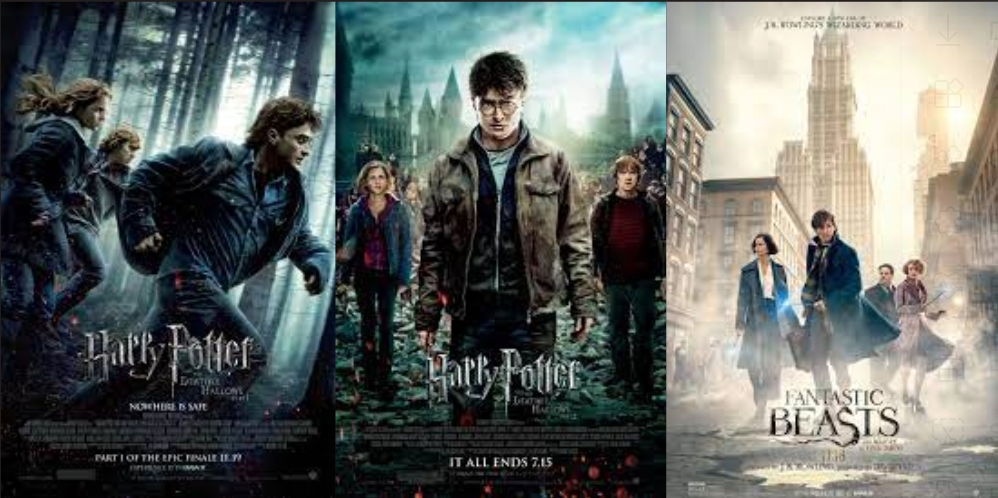

In [ ]:
get_recommendations('Down Periscope', cosine_sim)

,id,title,director_name,actor,genres_list,keywords
3557,9942,Major League,David S. Ward,"['Tom Berenger', 'Charlie Sheen', 'Corbin Bern...",[Comedy],"['baseball', 'sport', 'sabotage', 'sombrero', ..."
6764,11067,Major League II,David S. Ward,"['Charlie Sheen', 'Tom Berenger', 'Corbin Bern...",[Comedy],"['baseball', 'sport', 'sequel', 'sports league']"
5222,10804,King Ralph,David S. Ward,"['John Goodman', ""Peter O'Toole"", 'John Hurt',...","[Comedy, Family]","['love at first sight', ""love of one's life"", ..."
433,18133,The Program,David S. Ward,"['James Caan', 'Halle Berry', 'Omar Epps', 'Cr...",[Drama],"['american football', 'sport']"
1135,9611,Romy and Michele's High School Reunion,David Mirkin,"['Mira Sorvino', 'Lisa Kudrow', 'Janeane Garof...",[Comedy],"['smoking', 'overweight child', 'graduation', ..."
1367,24560,Sour Grapes,Larry David,"['Steven Weber', 'Craig Bierko', 'Viola Harris...",[Comedy],"['greed', 'dollar', 'jackpot', 'atlantic city'..."
1535,14013,BASEketball,David Zucker,"['Trey Parker', 'Matt Stone', 'Yasmine Bleeth'...",[Comedy],"['stadium', 'invention', 'sport', 'mascot', 'p..."
3577,2171,Wet Hot American Summer,David Wain,"['Janeane Garofalo', 'David Hyde Pierce', 'Mic...",[Comedy],"['adolescence', 'summer camp', 'independent fi..."
4020,31805,Road to Morocco,David Butler,"['Bing Crosby', 'Bob Hope', 'Dorothy Lamour', ...",[Comedy],"['morocco', 'castaway', 'road movie']"
4494,25297,Cannery Row,David S. Ward,"['Nick Nolte', 'Debra Winger', 'Audra Lindley'...",[Drama],['cannery']


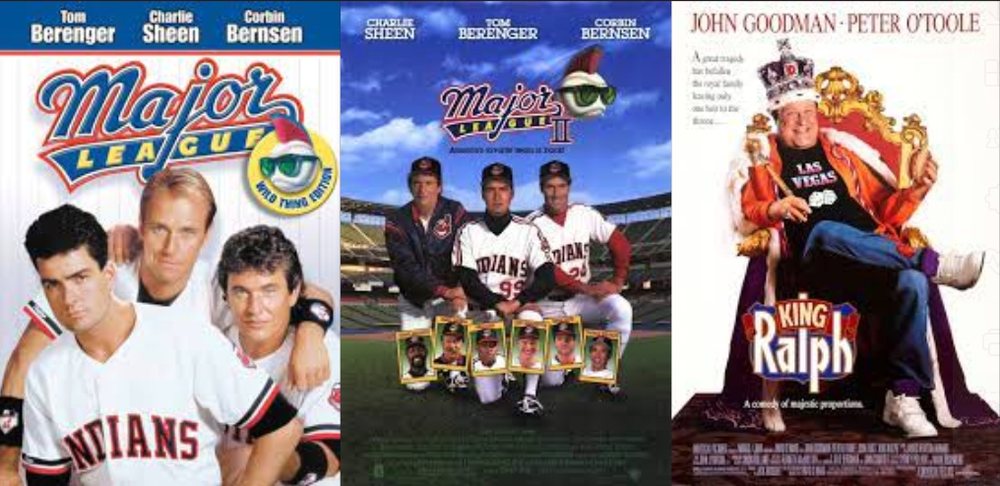

## **Model 3 & 4: LightFm model**

In [ ]:
df_rating = pd.read_csv('./data/ratings.csv')
df_rating.head()

,userId,movieId,rating,timestamp
0,1,110,1.0,1425941529
1,1,147,4.5,1425942435
2,1,858,5.0,1425941523
3,1,1221,5.0,1425941546
4,1,1246,5.0,1425941556


In [ ]:
df_rating.drop(columns = 'timestamp', inplace=True)
df_rating.columns = ['user_id','movie_id','rating']
df_rating.head()

,user_id,movie_id,rating
0,1,110,1.0
1,1,147,4.5
2,1,858,5.0
3,1,1221,5.0
4,1,1246,5.0


In [ ]:
df_rating.user_id.nunique(), df_rating.movie_id.nunique()

(270896, 45115)

### **Prepare movie features**

1. Apply the same encoder that we used to split train/test data

2. Columns refer to the column names of the item features (product_id excluded)

3. To prepare the item_features, need to use the Dataset class in LightFM API.

4. First fit the dataset instance and then call function build_item_features to generate the item features for modeling.

In [ ]:
df_movie_features = pd.read_csv('./data/data_movies_features.csv', encoding='utf_8')
df_movie_features.rename(columns = {'id':'movie_id'}, inplace=True)
df_movie_features

,movie_id,original_language,popularity,runtime,title,vote_average,vote_count,year,genres_list,production_companies_list,actor,director_name,keywords
0,862,en,21.946943,81.0,Toy Story,7.7,5415.0,1995.0,"['Animation', 'Comedy', 'Family']",Pixar Animation Studios,"['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim...",John Lasseter,"['jealousy', 'toy', 'boy', 'friendship', 'frie..."
1,8844,en,17.015539,104.0,Jumanji,6.9,2413.0,1995.0,"['Adventure', 'Fantasy', 'Family']",TriStar Pictures Teitler Film Interscope Commu...,"['Robin Williams', 'Jonathan Hyde', 'Kirsten D...",Joe Johnston,"['board game', 'disappearance', ""based on chil..."
2,15602,en,11.712900,101.0,Grumpier Old Men,6.5,92.0,1995.0,"['Romance', 'Comedy']",Warner Bros. Lancaster Gate,"['Walter Matthau', 'Jack Lemmon', 'Ann-Margret...",Howard Deutch,"['fishing', 'best friend', 'duringcreditssting..."
3,31357,en,3.859495,127.0,Waiting to Exhale,6.1,34.0,1995.0,"['Comedy', 'Drama', 'Romance']",Twentieth Century Fox Film Corporation,"['Whitney Houston', 'Angela Bassett', 'Loretta...",Forest Whitaker,"['based on novel', 'interracial relationship',..."
4,11862,en,8.387519,106.0,Father of the Bride Part II,5.7,173.0,1995.0,['Comedy'],Sandollar Productions Touchstone Pictures,"['Steve Martin', 'Diane Keaton', 'Martin Short...",Charles Shyer,"['baby', 'midlife crisis', 'confidence', 'agin..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22452,84419,en,0.222814,65.0,House of Horrors,6.3,8.0,1946.0,"['Horror', 'Mystery', 'Thriller']",Universal Pictures,"['Rondo Hatton', 'Robert Lowery', 'Virginia Gr...",Jean Yarbrough,"['revenge', 'murder', 'serial killer', 'new yo..."
22453,289923,en,0.386450,30.0,The Burkittsville 7,7.0,1.0,2000.0,['Horror'],Neptune Salad Entertainment Pirie Productions,"['Monty Bane', 'Lucy Butler', 'David Grammer',...",Ben Rock,"['witch', 'mythology', 'legend', 'serial kille..."
22454,222848,en,0.661558,85.0,Caged Heat 3000,3.5,1.0,1995.0,['Science Fiction'],Concorde-New Horizons,"['Lisa Boyle', 'Kena Land', 'Zaneta Polard', '...",Aaron Osborne,[]
22455,30840,en,5.683753,104.0,Robin Hood,5.7,26.0,1991.0,"['Drama', 'Action', 'Romance']",Westdeutscher Rundfunk (WDR) Working Title Fil...,"['Patrick Bergin', 'Uma Thurman', 'David Morri...",John Irvin,[]


In [ ]:
all_movie_ids = __builtins__.list(set(df_rating['movie_id']))

df_movie_features['movie_id'] = df_movie_features['movie_id'].apply(lambda x: 'other' if x not in all_movie_ids else x)
df_movie_features = df_movie_features[df_movie_features['movie_id'] != 'other']

In [ ]:
len(__builtins__.list(set(df_movie_features['movie_id']))) == len(__builtins__.list(set(df_rating['movie_id'])))

False

In [ ]:
all_movie_ids_features = __builtins__.list(set(df_movie_features['movie_id']))

df_rating['movie_id'] = df_rating['movie_id'].apply(lambda x: 'other' if x not in all_movie_ids_features else x)
df_rating = df_rating[df_rating['movie_id'] != 'other']

In [ ]:
len(__builtins__.list(set(df_movie_features['movie_id']))) == len(__builtins__.list(set(df_rating['movie_id'])))

True

In [ ]:
ratings = df_rating.to_dict('records')

for line in islice(ratings, 2):
    print(json.dumps(line, indent=4))

{
    "user_id": 1,
    "movie_id": 858,
    "rating": 5.0
}
{
    "user_id": 1,
    "movie_id": 1246,
    "rating": 5.0
}


### **Building the ID mapping**

#### **CF model**

In [ ]:
dataset = Dataset()
dataset.fit((x['user_id'] for x in ratings), (x['movie_id'] for x in ratings))

# quick check to determine the number of unique users and items in the data
num_users, num_movies = dataset.interactions_shape()
print(f'Num users: {num_users}, num_movies: {num_movies}.')

Num users: 261810, num_movies: 4125.


#### **Hybrid model**

In [ ]:
def generate_feature_list(df, columns):
    '''
    Generate the list of features of corresponding columns to list
    In order to fit the lightfm Dataset
    '''
    features = df[columns].apply(lambda x: ','.join(x.map(str)), axis = 1)
    features = features.str.split(',')
    features = features.apply(pd.Series).stack().reset_index(drop = True)
    return features

def prepare_item_features(df, columns, id_col_name):
    '''
    Prepare the corresponding feature formats for
    the lightdm.dataset's build_item_features function
    '''
    features = df[columns].apply(lambda x: ','.join(x.map(str)), axis = 1)
    features = features.str.split(',')
    features = __builtins__.list(zip(df[id_col_name], features))
    return features

In [ ]:
columns = df_movie_features.columns.to_list()
columns.remove('movie_id')

In [ ]:
dataset2 = Dataset()

fitting_item_features = generate_feature_list(df_movie_features, columns)
lightfm_features = prepare_item_features(df_movie_features, columns, 'movie_id')

# dataset2.fit((x['user_id'] for x in ratings), (x['movie_id'] for x in ratings), item_features=all_directors)
dataset2.fit((x['user_id'] for x in ratings), (x['movie_id'] for x in ratings), item_features = fitting_item_features)
# item_features = dataset2.build_item_features(((x['movie_id'], x['director_name']) for x in df_movie_features))
item_features = dataset2.build_item_features(lightfm_features, normalize = True)

### **Building the Interaction matrix**

#### **CF model**

The build_interactions method returns 2 COO sparse matrices, namely the interactions and weights matrices.

In [ ]:
(interactions, weights) = dataset.build_interactions(((x['user_id'], x['movie_id'], x['rating']) for x in ratings))

print(repr(interactions))

<261810x4125 sparse matrix of type '<class 'numpy.int32'>'
	with 8058110 stored elements in COOrdinate format>


**Split train - test set**

In [ ]:
train_interactions, test_interactions = cross_validation.random_train_test_split(
    weights, test_percentage=0.2,
    random_state=np.random.RandomState(42))

In [ ]:
print(f"Shape of train interactions: {train_interactions.shape}")
print(f"Shape of test interactions: {test_interactions.shape}")

Shape of train interactions: (261810, 4125)
Shape of test interactions: (261810, 4125)


#### **Hybrid model**

In [ ]:
(interactions2, weights2) = dataset2.build_interactions(((x['user_id'], x['movie_id'], x['rating']) for x in ratings))

print(repr(interactions2))

<261810x4125 sparse matrix of type '<class 'numpy.int32'>'
	with 8058110 stored elements in COOrdinate format>


In [ ]:
train_interactions2, test_interactions2 = cross_validation.random_train_test_split(
    weights2, test_percentage=0.2,
    random_state=np.random.RandomState(42))

In [ ]:
print(f"Shape of train interactions: {train_interactions2.shape}")
print(f"Shape of test interactions: {test_interactions2.shape}")

Shape of train interactions: (261810, 4125)
Shape of test interactions: (261810, 4125)


### **Building model**

#### CF model

In [ ]:
model_cf = LightFM(loss = 'warp',
                   no_components = 160,
                   item_alpha = 1e-7,
                   learning_rate = 0.02,
                   max_sampled = 50)

model_cf.fit(interactions=train_interactions, epochs = 20, num_threads = 4)

#### Hybrid model

In [ ]:
model_hybrid = LightFM(loss = 'warp',
                no_components = 160,
                item_alpha = 1e-7,
                learning_rate = 0.02,
                max_sampled = 50)

model_hybrid.fit(interactions=train_interactions2, item_features = item_features, epochs = 50, num_threads = 4)

## **Evaluation**

#### CF model

In [ ]:
df_result = pd.DataFrame(columns = ['Method', 'Evaluation Metric', 'Train', 'Test'])

auc_train = auc_score(model_cf, train_interactions).mean()
auc_test = auc_score(model_cf, test_interactions).mean()

precision_train = precision_at_k(model_cf, train_interactions, k = 10).mean()
precision_test = precision_at_k(model_cf, test_interactions, k = 10).mean()

df_result = df_result.append(pd.DataFrame([['CF', 'AUC', auc_train, auc_test],
                                           ['CF', 'Precision@10', precision_train, precision_test]],
                                          columns = df_result.columns))

In [ ]:
df_result

,Method,Evaluation Metric,Train,Test
0,CF,AUC,0.994330,0.962841
1,CF,Precision@10,0.594967,0.049118


#### Hybrid model

In [ ]:
auc_train = auc_score(model_hybrid, train_interactions2, item_features = item_features).mean()
auc_test = auc_score(model_hybrid, test_interactions2, item_features = item_features).mean()

precision_train = precision_at_k(model_hybrid, train_interactions2, item_features = item_features, k = 10).mean()
precision_test = precision_at_k(model_hybrid, test_interactions2, item_features = item_features, k = 10).mean()

df_result = df_result.append(pd.DataFrame([['Hybrid', 'AUC', auc_train, auc_test],
                                           ['Hybrid', 'Precision@10', precision_train, precision_test]],
                                          columns = df_result.columns))

In [ ]:
df_result

,Method,Evaluation Metric,Train,Test
0,CF,AUC,0.994330,0.962841
1,CF,Precision@10,0.594967,0.049118
0,Hybrid,AUC,0.994585,0.961460
1,Hybrid,Precision@10,0.599013,0.046722


### Recommendation

In [ ]:
def get_positive_movie_id(weighted_interactions, user_id, movie_id_mapping):
    # list la mot np.array luu ID cua cac cuon sach duoc nguoi dung, co ID la user_id, danh gia 5 sao
    list = []
    for i in weighted_interactions.tocsr()[user_id].indices:
        if weighted_interactions.tocsr()[user_id, i] >= 4:
            list.append(movie_id_mapping[i])

    return np.array(list)

# these are users we want to generate recommendations for
def sample_recommendation(model, weighted_interactions, dataset, user_ids, items_data):

    # number of users and books in data
    n_users, n_items = weighted_interactions.shape
    items_data.set_index(['movie_id'], inplace=True)

    # generate recommendations for each user we input
    for user_id in user_ids:

        # considers ratings that are 5 'positive' and ratings that are 4 or below 'negative'
        # to make the problem binary -> much simple

        # In this dictionary, the Values are the internal indices and the Keys are external ids.
        movie_id_mapping = dataset.mapping()[2]
        # Invert these to map internal indices to external ids.
        inv_movie_id_mapping = {v: k for k, v in movie_id_mapping.items()}

        # books they already like
        known_positives = get_positive_movie_id(weighted_interactions, user_id, inv_movie_id_mapping)

        # books our model predicts they will like
        user_x = dataset.mapping()[0][user_id]
        scores = model.predict(user_x, np.arange(n_items))
        # np.argsort(-score) rank them in order of most like to least
        # mapping internal indices to external ids of top_items
        top_recommendations = np.array([inv_movie_id_mapping[i] for i in np.argsort(-scores)])

        # print out the results
        print("User %s --------------------------------------- \n" % user_id)

        print("    Known positives:")
        display(items_data.loc[known_positives[:3]])

        print("    Recommended:")
        display(items_data.loc[top_recommendations[:3]])

#### CF model

In [ ]:
sample_recommendation(model_cf, weights, dataset, [5, 21], df_movie_features[['movie_id', 'title', 'year', 'director_name']])

User 5 --------------------------------------- 

    Known positives:


,title,year,director_name
movie_id,,,
2565,Joe Versus the Volcano,1990.0,John Patrick Shanley


    Recommended:


,title,year,director_name
movie_id,,,
541,The Man with the Golden Arm,1955.0,Otto Preminger
750,Murder She Said,1961.0,George Pollock
3114,The Searchers,1956.0,John Ford


User 21 --------------------------------------- 

    Known positives:


,title,year,director_name
movie_id,,,
260,The 39 Steps,1935.0,Alfred Hitchcock
4993,5 Card Stud,1968.0,Henry Hathaway
1610,Fever Pitch,1997.0,David Evans


    Recommended:


,title,year,director_name
movie_id,,,
1645,A Time to Kill,1996.0,Joel Schumacher
2006,"Bell, Book and Candle",1958.0,Richard Quine
31696,A Kiss Before Dying,1991.0,James Dearden


User 5 ---------------------------------------  
Known positives:  
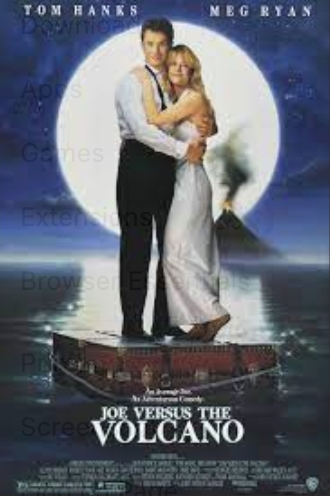

Recommended:  
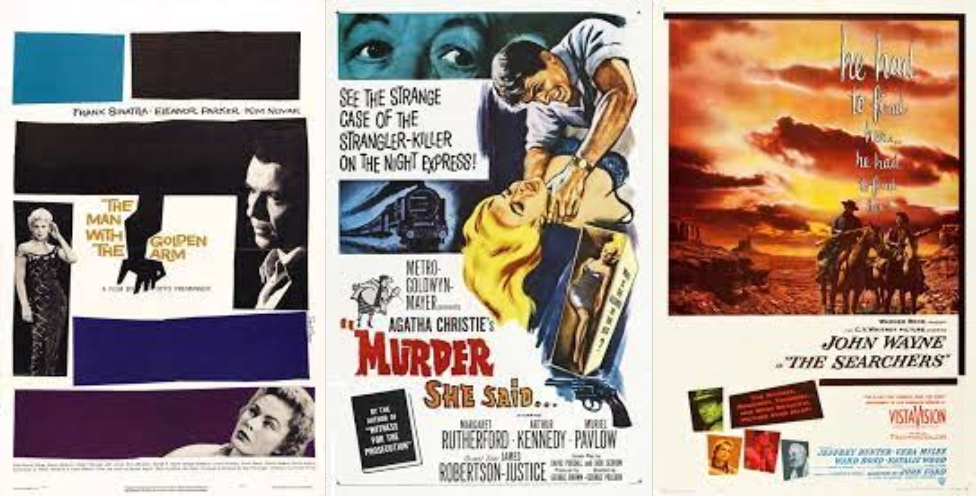

User 21 ---------------------------------------  
Known positives:  
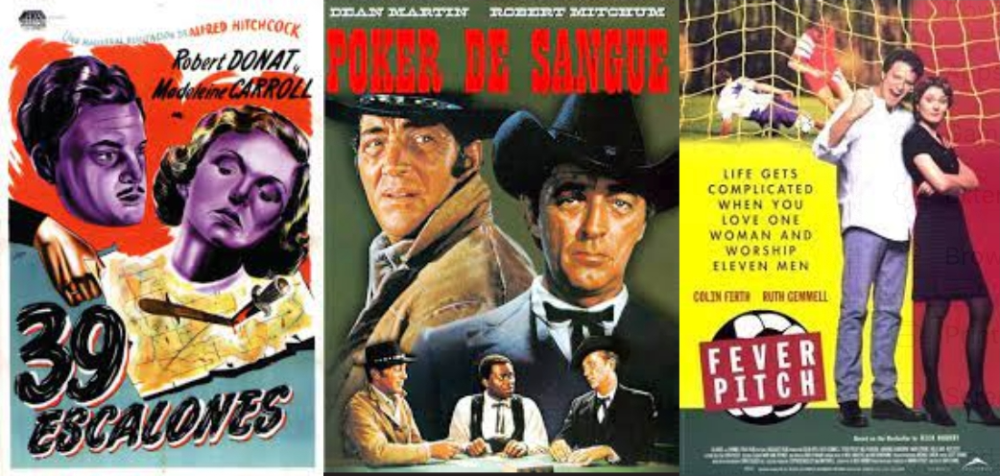

Recommended:  
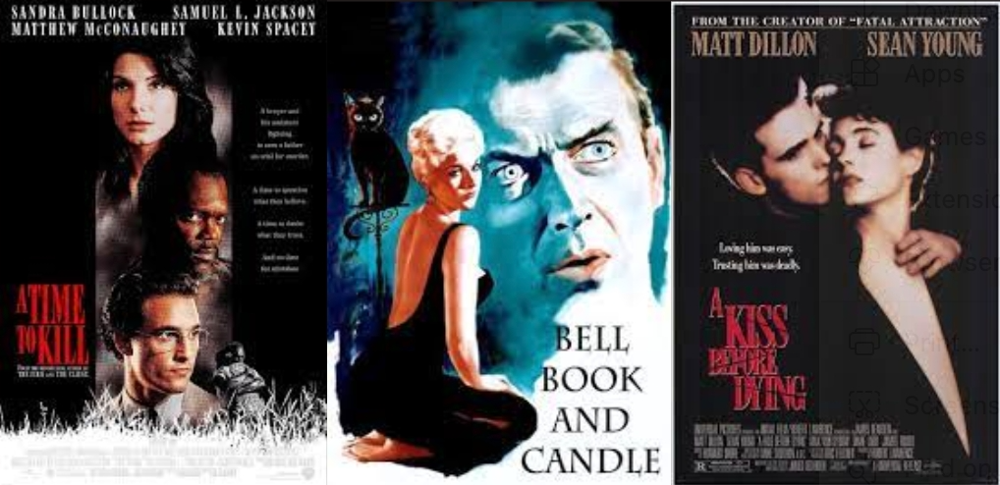


#### Hybrid model

In [ ]:
sample_recommendation(model_hybrid, weights2, dataset2, [5, 21], df_movie_features[['movie_id', 'title', 'year', 'director_name']])

User 5 --------------------------------------- 

    Known positives:


,title,year,director_name
movie_id,,,
2565,Joe Versus the Volcano,1990.0,John Patrick Shanley


    Recommended:


,title,year,director_name
movie_id,,,
750,Murder She Said,1961.0,George Pollock
541,The Man with the Golden Arm,1955.0,Otto Preminger
4993,5 Card Stud,1968.0,Henry Hathaway


User 21 --------------------------------------- 

    Known positives:


,title,year,director_name
movie_id,,,
260,The 39 Steps,1935.0,Alfred Hitchcock
4993,5 Card Stud,1968.0,Henry Hathaway
1610,Fever Pitch,1997.0,David Evans


    Recommended:


,title,year,director_name
movie_id,,,
4643,The Guardian,2006.0,Andrew Davis
31696,A Kiss Before Dying,1991.0,James Dearden
1645,A Time to Kill,1996.0,Joel Schumacher


User 5: ---------------------------------------  
Known positives:  
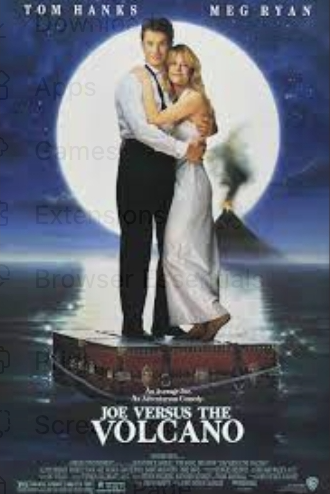

Recommended:  
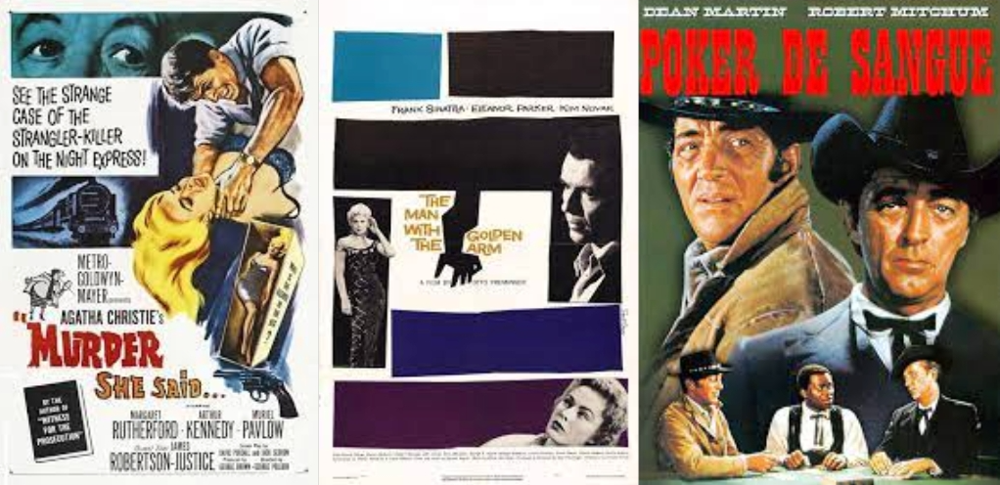

User 21: ------------------------------------------  
Known positives:  
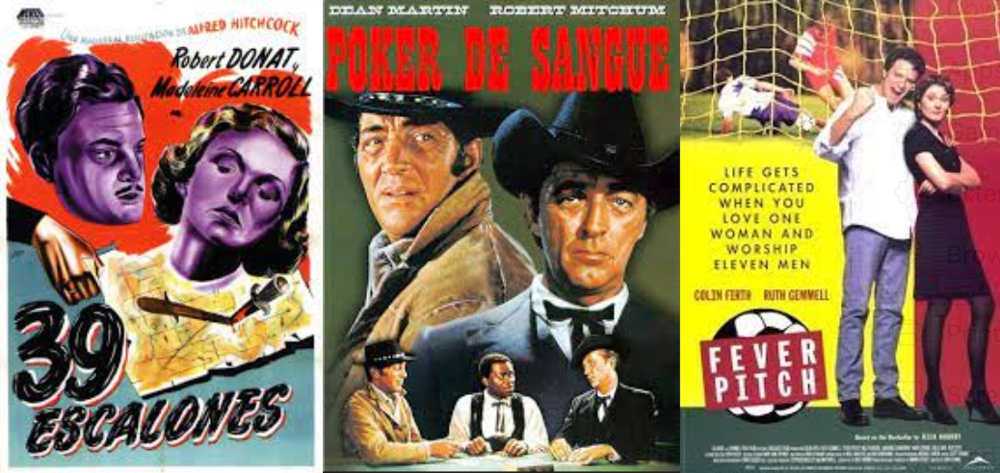
Recommended:  
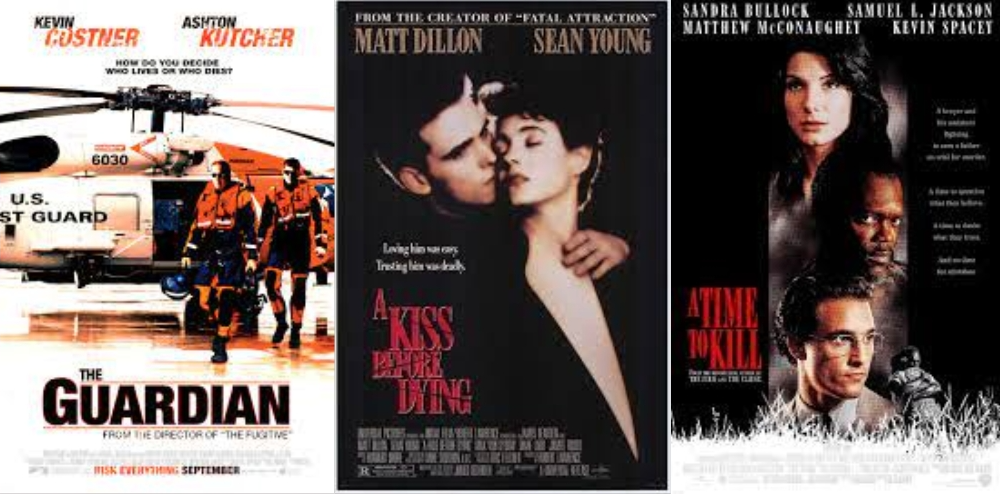